In [2]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from matplotlib import animation 
from IPython.display import HTML
import numpy as np
from sklearn.preprocessing import StandardScaler
from matplotlib import animation 
from IPython.display import HTML
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage.filters import gaussian_filter1d
import warnings
warnings.filterwarnings("ignore")
from matplotlib.lines import Line2D
from mpl_toolkits.mplot3d import Axes3D

/var/folders/mc/qbcjsrl16h3gf6t6xvz8czzw0000gn/T/ipykernel_18279/2488517867.py:6: DeprecationWarning: Please import `gaussian_filter1d` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter1d


## Link to main toutorial by Pietro Marchesi
https://pietromarchesi.net/pca-neural-data.html#example

## Loading my neural_data

In [4]:
mouse = 'reach1_4'


probe = 'B' # probe used for the neural data
bin_size_in_ms = 50 # in milliseconds
output_dimension = 8 # number of dimensions for the embeddingspre
pre_reach = 0.5
post_reach = 10

In [5]:
mouse = 'reach1_4'

if mouse == 'necab1':
    num_reaches = 182

if mouse == 'reach1_4':
    num_reaches = 278



In [6]:
pre_reach_str = str(pre_reach)
if pre_reach < 1:
    window_size = f'{pre_reach_str[0]}{pre_reach_str[-1]}_{post_reach}_timeWindow'
if pre_reach >= 1:
    window_size = f'{pre_reach_str}_{post_reach}_timeWindow'

In [7]:
# the path to the .npy file for the neural data (structred as firing rates x time x neurons)
neural_data_path =f'neural_data/{mouse}_{bin_size_in_ms}ms_FR_{window_size}_{probe}.npy'
print(neural_data_path)
neural_data = np.load(neural_data_path)
neural_data.shape, neural_data[0].shape, 
neural_data

neural_data/reach1_4_50ms_FR_05_10_timeWindow_B.npy


array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ...,
       [60., 20., 20., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0., 20.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

# Formating my data

- trials is a list of K Numpy arrays of shape N×T (number of neurons by number of time points).
- trial_type is a list of length K containing the type (i.e. the orientation) of every trial.
- trial_types is a list containing the unique trial types (i.e. orientations) in ascending order.

In [8]:
neural_data.shape

(538, 58380)

In [9]:

# Assuming `neural_data_transposed` is your data with shape (538, 58380)
neurons, total_time_bins = neural_data.shape
time_bins_per_trial = 210
num_trials = total_time_bins // time_bins_per_trial
# Reshape the data to separate it into trials
# The new shape will be (number of trials, number of neurons, time bins per trial)
trials = neural_data.reshape(neurons, num_trials, time_bins_per_trial).swapaxes(0, 1)

print(f"Number of trials: {len(trials)}")
print(f"Shape of each trial's data: {trials[0].shape}")


Number of trials: 278
Shape of each trial's data: (538, 210)


In [10]:
n_reaches = 278
trials = trials

trial_type = np.array(['baseline'] * n_reaches)
unique_trial_types = np.unique(trial_type)

trial_size = trials[0].shape[1]
Nneurons = trials[0].shape[0] 


In [11]:
trial_types = np.unique(trial_type)
t_type_ind = {t: np.where(trial_type == t)[0] for t in trial_types}
t_type_ind


{'baseline': array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 1

In [12]:
print('Number of trials: {}'.format(len(trials)))
print('Types of trials (reaches): {}'.format(trial_types[0:3])) 
print('Dimensions of single trial array (# neurons by # time points): {}'.format(trials[0].shape))
print('Trial types (orientations): {}'.format(trial_types[0:3]))
print('Trial type of the first 3 trials: {}'.format(trial_type[0:3]))
print('trail size: {}'.format(trial_size))
print('Number of neurons: {}'.format(Nneurons))

Number of trials: 278
Types of trials (reaches): ['baseline']
Dimensions of single trial array (# neurons by # time points): (538, 210)
Trial types (orientations): ['baseline']
Trial type of the first 3 trials: ['baseline' 'baseline' 'baseline']
trail size: 210
Number of neurons: 538


# Cell 1, 
We begin by defining a function called center which accepts an array X of shape #features×#samples
 and returns an array of the same shape where each row is mean-subtracted (has mean zero).

### My data cell 1

In [13]:

X = neural_data  # data array of shape n_neuron by n_time_points
X.shape

(538, 58380)

In [16]:
def center(X):
    # X: ndarray, shape (n_features, n_samples)
    ss = StandardScaler(with_mean=True, with_std=False)
    Xc = ss.fit_transform(X.T).T
    return Xc

# replaced X with my neural data
X = neural_data  # data array of shape n_neuron by n_time_points
print(X.shape)

X = center(X)
c = np.cov(X, rowvar=True) # covariance matrix
eig_vals, eig_vecs = np.linalg.eig(c)
srt = np.argsort(eig_vals)[::-1]
print(eig_vecs.shape)
print('Sorted eigenvalues: \n{}'.format(eig_vals[srt][0:5]))
print('\nFirst eigenvector: \n{}'.format(eig_vecs[:, srt][:, 0])*1000)

(538, 58380)
(538, 538)
Sorted eigenvalues: 
[6509.96994074 3669.76572868 1985.66545791 1477.82333342 1210.21058189]

First eigenvector: 
[-4.67649671e-02 -6.59118091e-02 -2.71503536e-04 -1.95370560e-02
 -2.54387349e-02 -1.28248341e-03  7.20004516e-04 -7.30451968e-02
 -1.11118244e-03 -1.23658508e-01 -3.30815679e-03 -8.40623034e-06
  8.08810057e-03 -2.80368078e-04 -3.55216648e-02 -1.94234555e-02
 -3.07528163e-03 -2.42920265e-04 -5.28665467e-04 -1.33516554e-02
 -3.38228341e-02 -5.98593426e-02 -3.67048167e-04 -5.13661587e-02
 -6.44330562e-02 -5.25812700e-03 -2.19638959e-02 -9.09077571e-02
 -1.74350659e-03 -1.22388959e-02 -6.11684234e-02 -9.34106874e-03
 -1.28325428e-02 -2.62349487e-05  4.99987142e-04 -1.24274440e-03
 -3.73832790e-04 -2.32175698e-02  3.89920335e-04 -6.21502722e-02
 -8.10518070e-04 -4.51886825e-02 -3.30270074e-02 -6.58601725e-02
 -1.04533217e-01 -4.31250442e-02 -1.61804174e-04  2.39276145e-05
 -9.80000609e-02 -1.94782925e-05 -5.14828382e-03 -5.16252910e-02
 -1.82521439e-02 

### my data cell 2

In [1]:
def z_score(X):
    # X: ndarray, shape (n_features, n_samples)
    ss = StandardScaler(with_mean=True, with_std=True)
    Xz = ss.fit_transform(X.T).T
    return Xz

X = neural_data
print(neural_data.shape)
# X = np.array([[5., 6., 5.],
#               [50., 60., 50.]])
 # data array of shape n_neuron by n_time_points
X = z_score(X)
c = np.cov(X, rowvar=True) # covariance matrix

eig_vals, eig_vecs = np.linalg.eig(c)
srt = np.argsort(eig_vals)[::-1]
print('Sorted eigenvalues: \n{}'.format(eig_vals[srt][0:10]))
print('\nFirst eigenvector: \n{}'.format(eig_vecs[:, srt][:, 0])*100)



NameError: name 'neural_data' is not defined

In [81]:
shade_alpha      = 0.2
lines_alpha      = 0.8
pal = sns.color_palette('husl', 9)
%config InlineBackend.figure_format = 'svg'

    
def add_orientation_legend(ax):
    custom_lines = [Line2D([0], [0], color=pal[k], lw=4) for
                    k in range(len(trial_types))]
    labels = ['{}$^\circ$'.format(t) for t in trial_types]
    ax.legend(custom_lines, labels,
              frameon=False, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout(rect=[0,0,0.9,1])

# Trial-response PCA


KeyError: 0

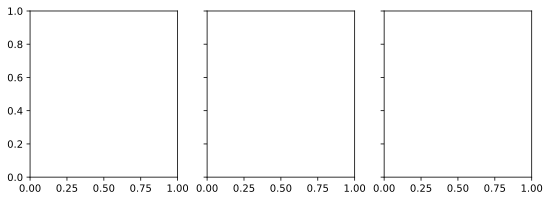

In [82]:
#Xr = np.vstack([t[:, frames_pre_stim:-frames_post_stim].mean(axis=1) for t in trials]).T
Xr = neural_data

# or take the max
#Xr = np.vstack([t[:, frames_pre_stim:-frames_post_stim].max(axis=1) for t in trials]).T

# or the baseline-corrected mean
#Xr = np.vstack([t[:, frames_pre_stim:-frames_post_stim].mean(axis=1) - t[:, 0:frames_pre_stim].mean(axis=1) for t in trials]).T

Xr_sc = z_score(Xr)

pca = PCA(n_components=15)
Xp = pca.fit_transform(Xr_sc.T).T

projections = [(0, 1), (1, 2), (0, 2)]
fig, axes = plt.subplots(1, 3, figsize=[9, 3], sharey='row', sharex='row')
for ax, proj in zip(axes, projections):
    for t, t_type in enumerate(trial_types):
        x = Xp[proj[0], t_type_ind[t]]
        y = Xp[proj[1], t_type_ind[t]]
        ax.scatter(x, y, c=pal[t], s=25, alpha=0.8)
        ax.set_xlabel('PC {}'.format(proj[0]+1))
        ax.set_ylabel('PC {}'.format(proj[1]+1))
sns.despine(fig=fig, top=True, right=True)
add_orientation_legend(axes[2])

# Trial-Averaged

In [17]:
trial_averages = []
for ind in t_type_ind:
    trial_averages.append(np.array(trials)[ind].mean(axis=0))
Xa = np.hstack(trial_averages)

In [18]:
n_components = 15
Xa = z_score(Xa) #Xav_sc = center(Xav)
pca = PCA(n_components=n_components)
Xa_p = pca.fit_transform(Xa.T).T

NameError: name 'time' is not defined

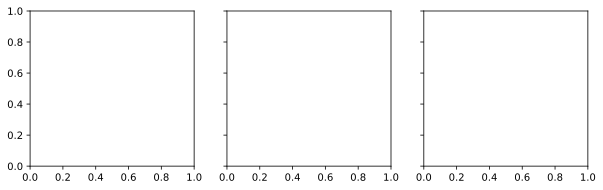

In [19]:
fig, axes = plt.subplots(1, 3, figsize=[10, 2.8], sharey='row')
for comp in range(3):
    ax = axes[comp]
    for kk, type in enumerate(trial_types):
        x = Xa_p[comp, kk * trial_size :(kk+1) * trial_size]
        x = gaussian_filter1d(x, sigma=3)
        ax.plot(time, x, c=pal[kk])
    ax.set_ylabel('PC {}'.format(comp+1))
add_orientation_legend(axes[2])
axes[1].set_xlabel('Time (s)')
sns.despine(fig=fig, right=True, top=True)
plt.tight_layout(rect=[0, 0, 0.9, 1])

[462 402 403]


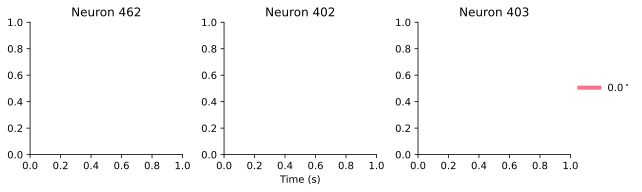

In [ ]:
# find the indices of the three largest elements of the second eigenvector
units = np.abs(pca.components_[1, :].argsort())[::-1][0:3]
print(units)

f, axes = plt.subplots(1, 3, figsize=[10, 2.8], sharey=False,
                       sharex=True)
for ax, unit in zip(axes, units):
    ax.set_title('Neuron {}'.format(unit))
    for t, ind in enumerate(t_type_ind):
        x = np.array(trials)[ind][:, unit, :]
        # sns.lineplot(x, time=time,
        #            ax=ax,
        #            err_style='ci_band',
        #            ci=95,
        #            color=pal[t])

axes[1].set_xlabel('Time (s)')
sns.despine(fig=f, right=True, top=True)
add_orientation_legend(axes[2])



[ 0.  0.  0.  0.  0.  0.  0.  0.  0. 20.  0. 20.  0. 20. 20.  0.  0.  0.
 20.  0.  0. 20.  0.  0.  0. 40.  0. 20. 20. 20.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0. 20. 20. 20.  0.  0. 20.  0.  0.  0.  0.  0.  0.  0.
  0. 20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0. 40.  0.  0.  0. 20.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0. 20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 20.  0.  0. 20.  0. 20. 20.
 20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 20.  0.  0.  0.  0.
  0.  0.  0. 20.  0.  0.  0.  0.  0.  0.  0.  0.]


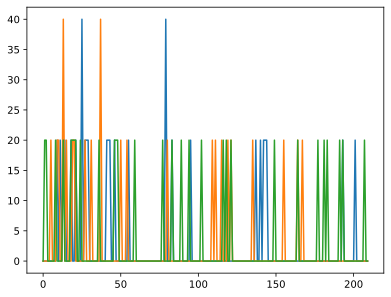

In [88]:
unit = 300
print(neural_data[unit][0:210])
plt.plot(neural_data[unit][0:210])
plt.plot(neural_data[unit][210:420])
plt.plot(neural_data[unit][630:840])
plt.show()

## Trial-concatenated PCA


In [83]:
Xl = np.hstack(trials)
Xl.shape

(538, 58380)

In [84]:
Xl = z_score(Xl)
n_components=15
pca = PCA(n_components)
Xl_p = pca.fit_transform(Xl.T).T

In [85]:
gt = {comp : {t_type : [] for t_type in trial_types} for comp in range(n_components)}


for comp in range(n_components):
    for i, t_type in enumerate(trial_type):
        t = Xl_p[comp, trial_size * i: trial_size * (i + 1)]
        gt[comp][t_type].append(t)

for comp in range(n_components):
    for t_type in trial_types:
        gt[comp][t_type] = np.vstack(gt[comp][t_type])


[[-0.93539447 -3.82716243 -3.94134783 ... -4.72167283 -5.56704037
  -3.81203665]
 [ 3.32504457 -4.58616405 -2.46413596 ... -6.423186   -4.47947733
  -4.75627201]
 [ 9.18671303 -1.5142264  -1.41729245 ... -3.15849117 -1.08167835
  -0.96023215]
 ...
 [15.94066359  3.41320045  2.13238009 ...  3.99184124  2.87790818
   3.03312254]
 [12.16176018  2.4772906   4.30913377 ...  0.26175576  2.87246914
   4.51151352]
 [ 3.38992628 -3.61341485 -3.79149677 ... -2.5576778  -3.06527343
  -3.07747332]]


ValueError: All arrays must be of the same length

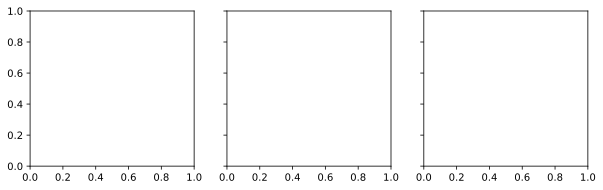

In [86]:
f, axes = plt.subplots(1, 3, figsize=[10, 2.8], sharey=True, sharex=True)
for comp in range(3):
    ax = axes[comp]
    for t, t_type in enumerate(trial_types):
        print(gt[comp][t_type])
        sns.tsplot(gt[comp][t_type], time=210, ax=ax,
                   err_style='ci_band',
                   ci=95,
                   color=pal[t])
    ax.set_ylabel('PC {}'.format(comp+1))
axes[1].set_xlabel('Time (s)')
sns.despine(right=True, top=True)
add_orientation_legend(axes[2])

In [33]:
# Plotting the data
plt.figure(figsize=(12, 6))
time_bins = np.arange(len(neural_data))  # Assuming each index corresponds to a time bin

# Plot each segment to highlight different parts as per your previous plots
plt.plot(time_bins[0:210], neural_data[0:210], label='Segment 1')


# Adding labels and title
plt.xlabel('Time Bins')
plt.ylabel('Average Firing Rate (Hz)')
plt.title('Peri-Stimulus Time Histogram (PSTH)')
plt.legend()

# Show the plot
plt.show()


KeyboardInterrupt: 

# 3d plot

In [423]:
# import the animation and the HTML module to create and render the animation


# smooth the single projected trials 
for i in range(len(projected_trials)):
    for c in range(projected_trials[0].shape[0]):
        projected_trials[i][c, :] = gaussian_filter1d(projected_trials[i][c, :], sigma=3)

# for every time point (imaging frame) get the position in PCA space of every trial
pca_frame = []
for t in range(trial_size):
    # projected data for all trials at time t 
    Xp = np.hstack([tr[:, None, t] for tr in projected_trials]).T
    pca_frame.append(Xp)
    
subspace = (1, 2) # pick the subspace given by the second and third components
    
# set up the figure
fig, ax = plt.subplots(1, 1, figsize=[6, 6]); plt.close()
ax.set_xlim(( -16, 16))
ax.set_ylim((-16, 16))
ax.set_xlabel('PC 2')
ax.set_xticks([-10, 0, 10])
ax.set_yticks([-10, 0, 10])
ax.set_ylabel('PC 3')
sns.despine(fig=fig, top=True, right=True)

# generate empty scatter plot to be filled by data at every time point
scatters = []
for t, t_type in enumerate(trial_types):
    scatter, = ax.plot([], [], 'o', lw=2, color=pal[t]);
    scatters.append(scatter)

# red dot to indicate when stimulus is being presented
stimdot, = ax.plot([], [], 'o', c='r', markersize=35, alpha=0.5)

# annotate with stimulus and time information
text     = ax.text(6.3, 9, 'Stimulus OFF \nt = {:.2f}'.format(time[0]), fontdict={'fontsize':14})

# this is the function to be called at every animation frame
def animate(i):
    for t, t_type in enumerate(trial_types):
        # find the x and y position of all trials of a given type
        x = pca_frame[i][t_type_ind[t], subspace[0]]
        y = pca_frame[i][t_type_ind[t], subspace[1]]
        # update the scatter
        scatters[t].set_data(x, y)
        
    # update stimulus and time annotation
    if (i > frames_pre_stim) and (i < (trial_size-frames_post_stim)):
        stimdot.set_data(10, 14)
        text.set_text('Stimulus ON \nt = {:.2f}'.format(time[i]))
    else:
        stimdot.set_data([], [])
        text.set_text('Stimulus OFF \nt = {:.2f}'.format(time[i]))
    return (scatter,)

# generate the animation
anim = animation.FuncAnimation(fig, animate, 
                               frames=len(pca_frame), interval=80, 
                               blit=False)

HTML(anim.to_jshtml()) # render animation

NameError: name 'projected_trials' is not defined

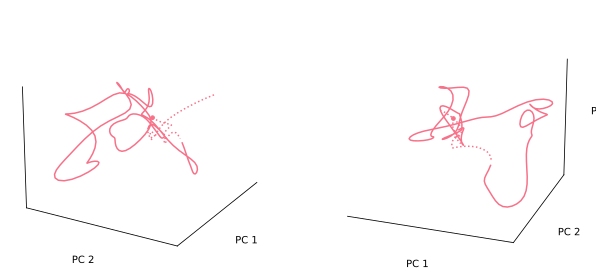

In [424]:
# prepare trial averages
trial_averages = []
for ind in t_type_ind:
    trial_averages.append(np.array(trials)[ind].mean(axis=0))
Xa = np.hstack(trial_averages)

# standardize and apply PCA
Xa = z_score(Xa) 
pca = PCA(n_components=3)
Xa_p = pca.fit_transform(Xa.T).T

# pick the components corresponding to the x, y, and z axes
component_x = 0
component_y = 1
component_z = 2

# create a boolean mask so we can plot activity during stimulus as 
# solid line, and pre and post stimulus as a dashed line
stim_mask = ~np.logical_and(np.arange(trial_size) >= frames_pre_stim,
               np.arange(trial_size) < (trial_size-frames_post_stim))

# utility function to clean up and label the axes
def style_3d_ax(ax):
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')

sigma = 3 # smoothing amount

# set up a figure with two 3d subplots, so we can have two different views
fig = plt.figure(figsize=[9, 4])
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax2 = fig.add_subplot(1, 2, 2, projection='3d')
axs = [ax1, ax2]

for ax in axs:
    for t, t_type in enumerate(trial_types):

        # for every trial type, select the part of the component
        # which corresponds to that trial type:
        x = Xa_p[component_x, t * trial_size :(t+1) * trial_size]
        y = Xa_p[component_y, t * trial_size :(t+1) * trial_size]
        z = Xa_p[component_z, t * trial_size :(t+1) * trial_size]
        
        # apply some smoothing to the trajectories
        x = gaussian_filter1d(x, sigma=sigma)
        y = gaussian_filter1d(y, sigma=sigma)
        z = gaussian_filter1d(z, sigma=sigma)

        # use the mask to plot stimulus and pre/post stimulus separately
        z_stim = z.copy()
        z_stim[stim_mask] = np.nan
        z_prepost = z.copy()
        z_prepost[~stim_mask] = np.nan

        ax.plot(x, y, z_stim, c = pal[t])
        ax.plot(x, y, z_prepost, c=pal[t], ls=':')
        
        # plot dots at initial point
        ax.scatter(x[0], y[0], z[0], c=pal[t], s=14)
        
        # make the axes a bit cleaner
        style_3d_ax(ax)
        
# specify the orientation of the 3d plot        
ax1.view_init(elev=22, azim=30)
ax2.view_init(elev=22, azim=110)
plt.tight_layout()

In [425]:
# apply some smoothing to the trajectories
for c in range(Xa_p.shape[0]):
    Xa_p[c, :] =  gaussian_filter1d(Xa_p[c, :], sigma=sigma)

# create the figure
fig = plt.figure(figsize=[9, 9]); plt.close()
ax = fig.add_subplot(1, 1, 1, projection='3d')

def animate(i):
    
    ax.clear() # clear up trajectories from previous iteration
    style_3d_ax(ax)
    ax.view_init(elev=22, azim=30)

    for t, t_type in enumerate(trial_types):
    
        x = Xa_p[component_x, t * trial_size :(t+1) * trial_size][0:i]
        y = Xa_p[component_y, t * trial_size :(t+1) * trial_size][0:i]
        z = Xa_p[component_z, t * trial_size :(t+1) * trial_size][0:i]
                
        stim_mask = ~np.logical_and(np.arange(z.shape[0]) >= frames_pre_stim,
                     np.arange(z.shape[0]) < (trial_size-frames_pre_stim))

        z_stim = z.copy()
        z_stim[stim_mask] = np.nan
        z_prepost = z.copy()
        z_prepost[~stim_mask] = np.nan
        
        ax.plot(x, y, z_stim, c = pal[t])
        ax.plot(x, y, z_prepost, c=pal[t], ls=':')

    ax.set_xlim(( -8, 8))
    ax.set_ylim((-8, 8))
    ax.set_zlim((-6, 6))

    return []


anim = animation.FuncAnimation(fig, animate,
                               frames=len(pca_frame), interval=50, 
                               blit=True)

HTML(anim.to_jshtml(default_mode='once'))

NameError: name 'pca_frame' is not defined

In [ ]:
# Example data loading
data =neural_data 

# Concatenating trials
# Assuming 'data' is structured as [trials, channels, time_points]
data_reshaped = data.reshape(-1, data.shape[-1])  # Reshape to [trials * channels, time_points]
